In [1]:
# Import statements
import numpy as np
import matplotlib.pyplot as plt
from multiprocessing import Pool
import pandas as pd
from statsmodels.tsa.stattools import acf
from scipy.interpolate import interp1d
import glob
import sys
from PIL import Image
# Setting defatult font family for plots
plt.rcParams["font.family"] = "Arial"

$R_0 = \dfrac{\beta\delta}{(\delta+\mu)(\gamma+\mu)}\Rightarrow \beta = \dfrac{R_0(\delta+\mu)(\gamma+\mu)}{\delta}$

In [2]:
# Constant Parameters
N = 1e5  # Total population
delta = 1/5 # Symptom onset rate (1/delta is the infectious)
gamma = 1/10  # Recovery rate (1/gamma is the infectious period)
R_0 = 4 # Basic reproduction number estimated for alpha variant
mu = 0.00003424657  # Birth and death rate
initial_infected = 10
initial_exposed = 0
max_time = 200
beta0 = R_0 * (delta+mu)*(gamma+mu)/delta

print(beta0)

beta_trans = 1 * (delta+mu)*(gamma+mu)/delta
print(beta_trans)

0.40020550287655116
0.10005137571913779


## Constant sim: $\beta(t)=\beta_0$
## Increasing sim: $\beta(t)=\beta_0+p*(t-\tau)$
## Decreasing sim: $\beta(t)=\beta_0-p$
## Step sim: $\beta(t)=\beta_0(1-H(t-\tau))+\beta_1(H(t-\tau))$

In [5]:
def long_run_averages(standardised):
    n = len(standardised)
    running_mean = np.zeros(n)
    running_std= np.zeros(n)
    for j in range(n):
        running_mean[j] = np.nanmean(standardised[1:j+1])
        running_std[j] = np.nanstd(standardised[1:j+1])
    return running_std, running_mean

def exceed_threshold_cutoffs(stat_timeseries, ltla):
    std_val = []
    mean_val = []
    running_std, running_mean = long_run_averages(stat_timeseries[ltla].values)
    std_val = np.concatenate((std_val,running_std))
    mean_val = np.concatenate((mean_val,running_mean))
    # Get indices where stat > mean + 2*sigma and indices where stat < mean - 2*sigma
    stat_timeseries = stat_timeseries[ltla].values
    indices_greater = [ n for n,i in enumerate(range(len(stat_timeseries))) if (stat_timeseries[i])>(mean_val+2*std_val)[i] ]
    indices_smaller =  [ n for n,i in enumerate(range(len(stat_timeseries))) if (stat_timeseries[i])<(mean_val-2*std_val)[i] ]
    all_indices = np.setdiff1d(np.unique(indices_greater + indices_smaller ),[1])    
    return all_indices,mean_val,std_val
    
def loop_EWSs_store_results_cutoffs(ews_dict, ltlas):
    indices_dict = {}
    mean_dict = {}
    std_dict = {}
    for stat in ews_dict.keys():
        indices_dict[stat] = {}
        mean_dict[stat] = {}
        std_dict[stat] = {}
        for ltla in ltlas:
            stat_data = ews_dict[stat][ltla].reset_index()
            indices, mean_val, std_val = exceed_threshold_cutoffs(stat_data, ltla)
            indices_dict[stat][ltla] = indices
            mean_dict[stat][ltla] = mean_val
            std_dict[stat][ltla] = std_val
    return indices_dict, mean_dict, std_dict

# Function to normalise EWS for 2-sigma calculations
def pandas_zscore(dataframe):
    rolling_mean = dataframe.expanding().mean()
    rolling_std = dataframe.expanding().std(ddof=0)
    normalise_stats = (dataframe - rolling_mean)/rolling_std
    return normalise_stats

# Function to calculate EWS on a rolling window for each column
def calculate_ews_rolling(wide_data, window_size):
    ews_data = {}
    rolling = wide_data.rolling(window=window_size,center=False, min_periods=1)
    # variance = (wide_data**2).rolling(window=window_size,center=False, min_periods=1).mean()
    variance = rolling.var()
    ews_data['variance'] = variance
    normalised_ews_data = {}
    for ews in ews_data.keys():
        normalised_ews_data[ews] = pandas_zscore(ews_data[ews])
    return ews_data, normalised_ews_data

# Get detect indices for timeline
from operator import itemgetter

def detect(arr, times, n):
    if len(arr) < n:
        return []
    time = []
    values = []
    i = 0
    while i < len(arr) - (n - 1):
        if all(arr[i + j] + 1 == arr[i + j + 1] for j in range(n - 1)):
            values.append(arr[i + n - 1])
            time.append(times[arr[i + n -1]])
            # Skip to the end of this sequence of consecutive numbers
            while i + n - 1 < len(arr) - 1 and arr[i + n - 1] + 1 == arr[i + n]:
                i += 1
        i += 1
    return time

In [5]:
const_files = glob.glob('Cases/alpha/constant/I*.npy')
for i, file in enumerate(const_files):
    I_constant = np.load(file) if i == 0 else np.vstack((I_constant,np.load(file)))
    R_file = file.replace('I','R')
    Reff_constant = np.load(R_file) if i == 0 else np.vstack((Reff_constant,np.load(R_file)))
increasing_files = glob.glob('Cases/alpha/increasing/I*.npy')
for i, file in enumerate(increasing_files):
    I_increasing = np.load(file) if i == 0 else np.vstack((I_increasing,np.load(file)))
    R_file = file.replace('I','R')
    Reff_increasing = np.load(R_file) if i == 0 else np.vstack((Reff_increasing,np.load(R_file)))
decreasing_files = glob.glob('Cases/alpha/decreasing/I*.npy')
for i, file in enumerate(decreasing_files):
    I_decreasing = np.load(file) if i == 0 else np.vstack((I_decreasing,np.load(file)))
    R_file = file.replace('I','R')
    Reff_decreasing = np.load(R_file) if i == 0 else np.vstack((Reff_decreasing,np.load(R_file)))
step_files = glob.glob('Cases/alpha/step/I*.npy')
for i, file in enumerate(step_files):
    I_step = np.load(file) if i == 0 else np.vstack((I_step,np.load(file)))
    R_file = file.replace('I','R')
    Reff_step = np.load(R_file) if i == 0 else np.vstack((Reff_step,np.load(R_file)))
days = np.arange(0,max_time+0.1,1)

In [ ]:
max_time = 200
days = np.arange(0,max_time+0.1,1)
times = np.arange(0,max_time+0.1,0.1)
tau = 30
num_res = 10000

drop_list = []
for i in range(np.shape(I_increasing)[0]):
    if Reff_increasing[i,1900] >= 3.75:
        drop_list.append(i)
I_increasing = np.delete(I_increasing, drop_list,axis=0)
Reff_increasing = np.delete(Reff_increasing, drop_list,axis=0)

num_res_inc = len(I_increasing)
num_res_inc

4375

In [ ]:
I_constant = I_constant[:10000,:]
I_decreasing = I_decreasing[:10000,:]
I_increasing = I_increasing[:num_res_inc,:]
I_step = I_step[:10000,:]
Reff_constant = Reff_constant[:10000,:]
Reff_decreasing = Reff_decreasing[:10000,:]
Reff_increasing = Reff_increasing[:num_res_inc,:]
Reff_step = Reff_step[:10000,:]

In [ ]:
df = pd.DataFrame(I_constant).T
stoch_cst = df.sub(df.mean(axis = 1), axis = 'rows')
df_step = pd.DataFrame(I_step).T
stoch_step = df_step.sub(df_step.mean(axis = 1), axis = 'rows')
df_increasing = pd.DataFrame(I_increasing).T
stoch_inc = df_increasing.sub(df_increasing.mean(axis = 1), axis = 'rows')
df_decreasing = pd.DataFrame(I_decreasing).T
stoch_dec = df_decreasing.sub(df_decreasing.mean(axis = 1), axis = 'rows')
df_increasing = pd.DataFrame(I_increasing).T
stoch_inc = df_increasing.sub(df_increasing.mean(axis = 1), axis = 'rows')

In [9]:
import pickle
if False:
    cst, cst_norm = calculate_ews_rolling(stoch_cst, 7)
    inc, inc_norm = calculate_ews_rolling(stoch_inc, 7)
    dec, dec_norm = calculate_ews_rolling(stoch_dec, 7)
    step, step_norm = calculate_ews_rolling(stoch_step, 7)

    ind_cst, mean_cst, std_cst = loop_EWSs_store_results_cutoffs(cst_norm,np.arange(num_res))
    ind_inc, mean_inc, std_inc = loop_EWSs_store_results_cutoffs(inc_norm,np.arange(num_res_inc))
    ind_dec, mean_dec, std_dec = loop_EWSs_store_results_cutoffs(dec_norm,np.arange(num_res))
    ind_step, mean_step, std_step = loop_EWSs_store_results_cutoffs(step_norm,np.arange(num_res))
    times_cst = {}
    times_inc = {}
    times_dec = {}
    times_step = {}

    for sim in np.arange(num_res):
        times_cst[sim] = detect(ind_cst['variance'][sim],days,3)
        times_dec[sim] = detect(ind_dec['variance'][sim],days,3)
        times_step[sim] = detect(ind_step['variance'][sim],days,3)

    for sim in np.arange(num_res_inc):
        times_inc[sim] = detect(ind_inc['variance'][sim],days,3)
    with open('Results/cases_times_const_alpha.pkl','wb') as output:
        pickle.dump(times_cst, output)
    with open('Results/cases_times_inc_alpha.pkl','wb') as output:
        pickle.dump(times_inc, output)
    with open('Results/cases_times_dec_alpha.pkl','wb') as output:
        pickle.dump(times_dec, output)
    with open('Results/cases_times_step_alpha.pkl','wb') as output:
        pickle.dump(times_step, output)
else:
    with open('Results/cases_times_const_alpha.pkl','rb') as output:
        times_cst = pickle.load(output)
    with open('Results/cases_times_inc_alpha.pkl','rb') as output:
        times_inc = pickle.load(output)
    with open('Results/cases_times_dec_alpha.pkl','rb') as output:
        times_dec = pickle.load(output)
    with open('Results/cases_times_step_alpha.pkl','rb') as output:
        times_step = pickle.load(output)

In [10]:
constant_crit = np.mean(times[np.where(np.abs(np.mean(Reff_constant,axis=0)-1)<=1e-2)])
inc_crit_up = np.mean(times[np.where(np.abs(np.mean(Reff_increasing,axis=0)-1)<=1e-2)][:5])
inc_crit_down = np.mean(times[np.where(np.abs(np.mean(Reff_increasing,axis=0)-1)<=1e-2)][5:])
dec_crit = np.mean(times[np.where(np.abs(np.mean(Reff_decreasing,axis=0)-1)<=1e-2)])
step_crit = tau

In [11]:
def test_int(X, t, betat, gamma, delta, mu):
    '''
    ODE's for Model 2: SIS with increasing vaccination rate model (elimination by vaccination)
    returns: prevalence mean-field equations (dI/dt), variance of fluctuations (Ivar, d\zeta/dt) and kurtosis of fluctuations (Ikurt)
    RUN: defines if p(t) (rate of vaccine uptake) will be slowing increasing for Ext simulations or fixed for null simulations 
    '''
    S = -betat(t)*X[0]*X[2]-mu*X[0]+mu
    E = betat(t)*X[0]*X[2]-(mu+delta)*X[1]
    I = delta*X[1] - (mu+gamma)*X[2]

    A = np.matrix([[-betat(t)*X[2]-mu, 0, -betat(t)*X[0]], 
                   [betat(t)*X[2],-(delta+mu),betat(t)*X[0]],
                   [0,delta,-(gamma+mu)]])
    B = np.matrix([[betat(t)*X[0]*X[2]+mu*X[0]+mu,-betat(t)*X[0]*X[2],0],
                   [-betat(t)*X[0]*X[2],betat(t)*X[0]*X[2]+(delta+mu)*X[1],-delta*X[1]],
                   [0,-delta*X[1],delta*X[1]+(gamma+mu)*X[2]]])

    Θ = np.matrix([[X[3],X[4],X[5]],
                   [X[4],X[6],X[7]],
                   [X[5],X[7],X[8]]])

    K = A*Θ +Θ*A.transpose()+B/1e5
    return [S, E, I, K[0,0], K[0,1], K[0,2], K[1,1], K[1,2], K[2,2]]

In [12]:
betat = lambda x: 0.4002
p = (0.4002-0.05)/100
tau = 30
def beta_increasing_t(t):
    betat = 0.05+p*(t-tau) if t > tau else 0.05
    if betat >= 0.4002:
        return 0.4002
    else:
        return betat

def beta_decreasing_t(t):
    betat = 0.4002-p*(t-tau) if t > tau else 0.4002
    if betat <= 0.05:
        return 0.05
    else:
        return betat

def beta_step_t(t):
    return 0.4002 if t<tau else 0.05

from scipy.integrate import odeint
ts = np.arange(0,200.1,0.1)
cst_theory = odeint(test_int,[(1e5-10)/1e5,0,10/1e5,0,0,0,0,0,0],ts,args=(betat,1/10,1/5,0.00003424657))
cst_inc = odeint(test_int,[(1e5-10)/1e5,0,10/1e5,0,0,0,0,0,0],ts,args=(beta_increasing_t,1/10,1/5,0.00003424657))
cst_dec = odeint(test_int,[(1e5-10)/1e5,0,10/1e5,0,0,0,0,0,0],ts,args=(beta_decreasing_t,1/10,1/5,0.00003424657))
cst_step = odeint(test_int,[(1e5-10)/1e5,0,10/1e5,0,0,0,0,0,0],ts,args=(beta_step_t,1/10,1/5,0.00003424657))

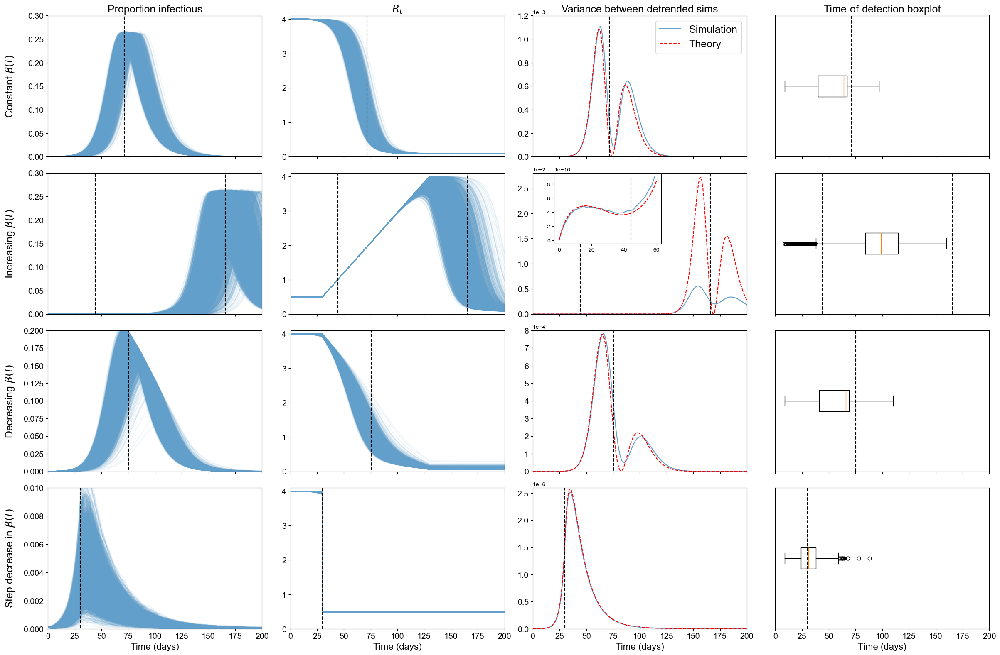

In [13]:
def norm(x):
    rolling_mean = x.expanding().mean()
    rolling_std = x.expanding().std(ddof=0)
    return (x-rolling_mean)/rolling_std

up_lims = [1.2e-3,2.8e-2,8e-4,2.6e-6]
up_lims_p = [0.3,0.3,0.2,0.01]

fig, axs = plt.subplots(nrows = 4, ncols = 4, figsize=(24,16),sharex=True)
for i in range(num_res):
    axs[0,0].plot(days,I_constant[i],color='#629FCA',alpha=0.1)
    axs[0,1].plot(times,Reff_constant[i],color='#629FCA',alpha=0.1)
axs[0,2].plot(days,stoch_cst.var(axis=1).values,color='#629FCA',label='Simulation')
axs[0,2].plot(ts,cst_theory[:,-1],color='r',linestyle='--',label='Theory')
axs[0,3].boxplot([j for i in times_cst.values() for j in i],vert=False)

axs[0,0].vlines(constant_crit,ymin=axs[0,0].get_yticks()[0],ymax=up_lims_p[0],color='k',linestyle='--')
axs[0,1].vlines(constant_crit,ymin=axs[0,1].get_yticks()[0],ymax=axs[0,1].get_yticks()[-1],color='k',linestyle='--')
axs[0,2].vlines(constant_crit,ymin=axs[0,2].get_yticks()[0],ymax=up_lims[0],color='k',linestyle='--')
axs[0,3].vlines(constant_crit,0.5,1.5,color='k',linestyle='--')

for i in range(num_res_inc):
    axs[1,0].plot(days,I_increasing[i],color='#629FCA',alpha=0.1)
    axs[1,1].plot(times,Reff_increasing[i],color='#629FCA',alpha=0.1)
axs[1,2].plot(days,stoch_inc.var(axis=1).values,color='#629FCA')
axs[1,2].plot(ts,cst_inc[:,-1],linestyle='--',color='r')
axs[1,3].boxplot([j for i in times_inc.values() for j in i],vert=False)


axs[1,0].vlines(inc_crit_up,ymin=axs[1,0].get_yticks()[0],ymax=up_lims_p[1],color='k',linestyle='--')
axs[1,1].vlines(inc_crit_up,ymin=axs[1,1].get_yticks()[0],ymax=axs[1,1].get_yticks()[-1],color='k',linestyle='--')
axs[1,2].vlines(inc_crit_up,ymin=axs[1,2].get_yticks()[0],ymax=up_lims[1],color='k',linestyle='--')
axs[1,3].vlines(inc_crit_up,0.5,1.5,color='k',linestyle='--')
axs[1,0].vlines(inc_crit_down,ymin=axs[1,0].get_yticks()[0],ymax=up_lims_p[1],color='k',linestyle='--')
axs[1,1].vlines(inc_crit_down,ymin=axs[1,1].get_yticks()[0],ymax=axs[1,1].get_yticks()[-1],color='k',linestyle='--')
axs[1,2].vlines(inc_crit_down,ymin=axs[1,2].get_yticks()[0],ymax=up_lims[1],color='k',linestyle='--')
axs[1,3].vlines(inc_crit_down,0.5,1.5,color='k',linestyle='--')

for i in range(num_res):
    axs[2,0].plot(days,I_decreasing[i],color='#629FCA',alpha=0.1)
    axs[2,1].plot(times,Reff_decreasing[i],color='#629FCA',alpha=0.1)
axs[2,2].plot(days,stoch_dec.var(axis=1).values,color='#629FCA')
axs[2,2].plot(ts,cst_dec[:,-1],linestyle='--',color='r')
axs[2,3].boxplot([j for i in times_dec.values() for j in i],vert=False)

axs[2,0].vlines(dec_crit,ymin=axs[2,0].get_yticks()[0],ymax=up_lims_p[2],color='k',linestyle='--')
axs[2,1].vlines(dec_crit,ymin=axs[2,1].get_yticks()[0],ymax=axs[2,1].get_yticks()[-1],color='k',linestyle='--')
axs[2,2].vlines(dec_crit,ymin=axs[2,2].get_yticks()[0],ymax=up_lims[2],color='k',linestyle='--')
axs[2,3].vlines(dec_crit,0.5,1.5,color='k',linestyle='--')

for i in range(num_res):
    axs[3,0].plot(days,I_step[i],color='#629FCA',alpha=0.1)
    axs[3,1].plot(times,Reff_step[i],color='#629FCA',alpha=0.1)
axs[3,0].set_xlabel('Time (days)',fontsize=16)
axs[3,1].set_xlabel('Time (days)',fontsize=16)
axs[3,2].plot(days,stoch_step.var(axis=1).values,color='#629FCA')
axs[3,2].plot(ts,cst_step[:,-1],linestyle='--',color='red')
axs[3,2].set_xlabel('Time (days)',fontsize=16)  
axs[3,3].boxplot([j for i in times_step.values() for j in i],vert=False)
axs[3,3].set_xlabel('Time (days)',fontsize=16)

axs[3,0].vlines(step_crit,ymin=axs[3,0].get_yticks()[0],ymax=up_lims_p[3],color='k',linestyle='--')
axs[3,1].vlines(step_crit,ymin=axs[3,1].get_yticks()[0],ymax=axs[3,1].get_yticks()[-1],color='k',linestyle='--')
axs[3,2].vlines(step_crit,ymin=axs[3,2].get_yticks()[0],ymax=up_lims[3],color='k',linestyle='--')
axs[3,3].vlines(step_crit,0.5,1.5,color='k',linestyle='--')

axs[0,0].set_title('Proportion infectious',fontsize=18)
axs[0,1].set_title(r'$R_t$',fontsize=18)
axs[0,2].set_title('Variance between detrended sims',fontsize=18)
axs[0,3].set_title('Time-of-detection boxplot',fontsize=18)

labels= [r'Constant $\beta(t)$',r'Increasing $\beta(t)$', r'Decreasing $\beta(t)$', r'Step decrease in $\beta(t)$']
for i in range(4):
    for j in range(4):
        axs[i,j].tick_params(axis='x', labelsize=14)
        axs[i,j].tick_params(axis='y', labelsize=14)
        if j == 3:
            axs[i,j].set_yticks([])
        if j == 0:
            axs[i,j].set_ylim((0,axs[i,j].get_ylim()[-1]))
        axs[i,j].set_xlim((0,200))
for i in range(4):
    axs[i,0].set_ylim([0,up_lims_p[i]])
    axs[i,1].set_ylim([0,4.1])
    axs[i,2].set_ylim([0,up_lims[i]])
    axs[i,2].ticklabel_format(axis='y',style='sci',scilimits=(0,0))
    axs[i,0].set_ylabel(labels[i],fontsize=18)
    axs[i,0].get_yaxis().set_label_coords(-0.15,0.5)
axs[0,2].legend(fontsize=18,loc = 'upper right')

iax = axs[1,2].inset_axes([0.1, 0.5, 0.5, 0.5])  # [left, bottom, width, height]
iax.plot(days[:60],stoch_inc.var(axis=1).values[:60],color='#629FCA')
iax.plot(ts[:600],cst_inc[:600,-1],linestyle='--',color='r')
iax.vlines(inc_crit_up,ymin=0,ymax=9e-10,color='k',linestyle='--')

plt.tight_layout()
#plt.savefig("Figures/prevalence_theory_corr_inset.png",dpi=300,bbox_inches='tight')
plt.savefig("Figures/Tiffs/Fig5.tiff", dpi=600, pil_kwargs={"compression": "tiff_lzw"})
plt.show()

In [15]:
num = 0
for i in range(len(times_inc)):
    if any(times_inc[i] <= inc_crit_up):
        num += 1
num / len(times_inc)

0.14971428571428572

In [16]:
num = 0
for i in range(len(times_inc)):
    if any(times_inc[i] >= inc_crit_down) :
        num += 1
num / len(times_inc)

0.0

In [14]:
df = pd.DataFrame(I_constant).T * N
res_cst = df.sub(df.mean(axis = 1), axis = 'rows')
df_step = pd.DataFrame(I_step).T *N
res_step = df_step.sub(df_step.mean(axis = 1), axis = 'rows')
df_increasing = pd.DataFrame(I_increasing).T* N
res_inc = df_increasing.sub(df_increasing.mean(axis = 1), axis = 'rows')
df_decreasing = pd.DataFrame(I_decreasing).T*N
res_dec = df_decreasing.sub(df_decreasing.mean(axis = 1), axis = 'rows')
df_increasing = pd.DataFrame(I_increasing).T*N
res_inc = df_increasing.sub(df_increasing.mean(axis = 1), axis = 'rows')

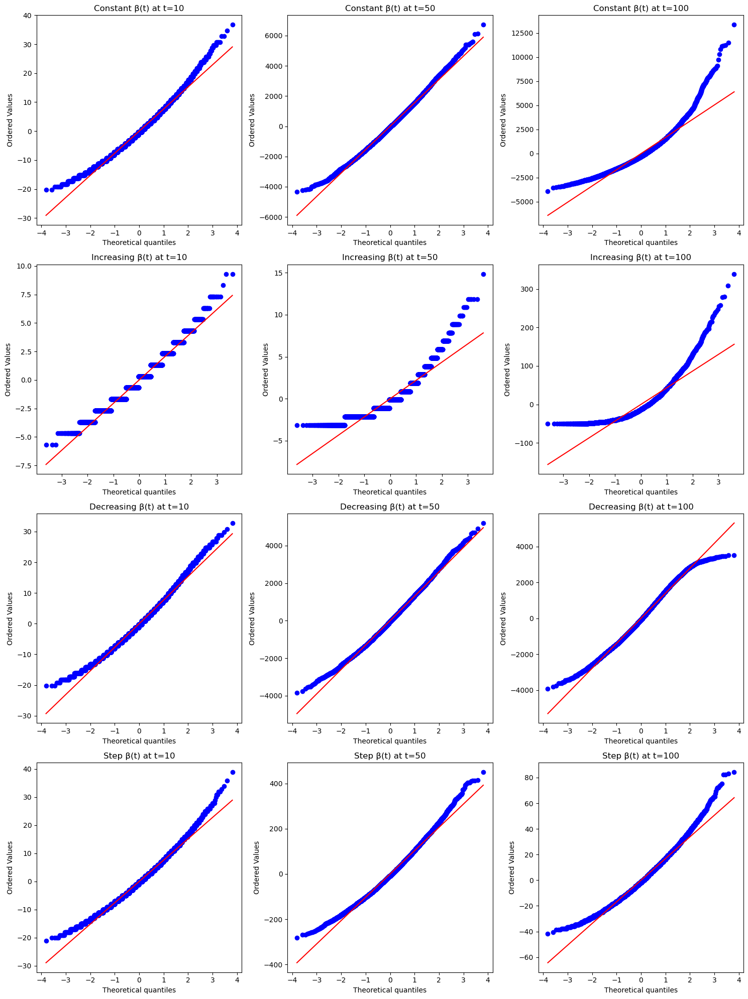

In [18]:
# Create QQ plots at 3 different times
import scipy.stats as stats
fig, axs = plt.subplots(4, 3, figsize=(15, 20))
times = [10, 50, 100]  # early, middle, and late times

for i, (res, label) in enumerate([(res_cst, 'Constant'), 
                                (res_inc, 'Increasing'), 
                                (res_dec, 'Decreasing'), 
                                (res_step, 'Step')]):
    for j, t in enumerate(times):
        # Get data for this time point
        data = res.iloc[t]
        
        # Create QQ plot
        stats.probplot(data, dist="norm", plot=axs[i,j])
        axs[i,j].set_title(f'{label} β(t) at t={t}')
        
# Adjust layout
plt.tight_layout()
plt.savefig("Figures/qq_plots.png", dpi=300, bbox_inches='tight')
plt.show()

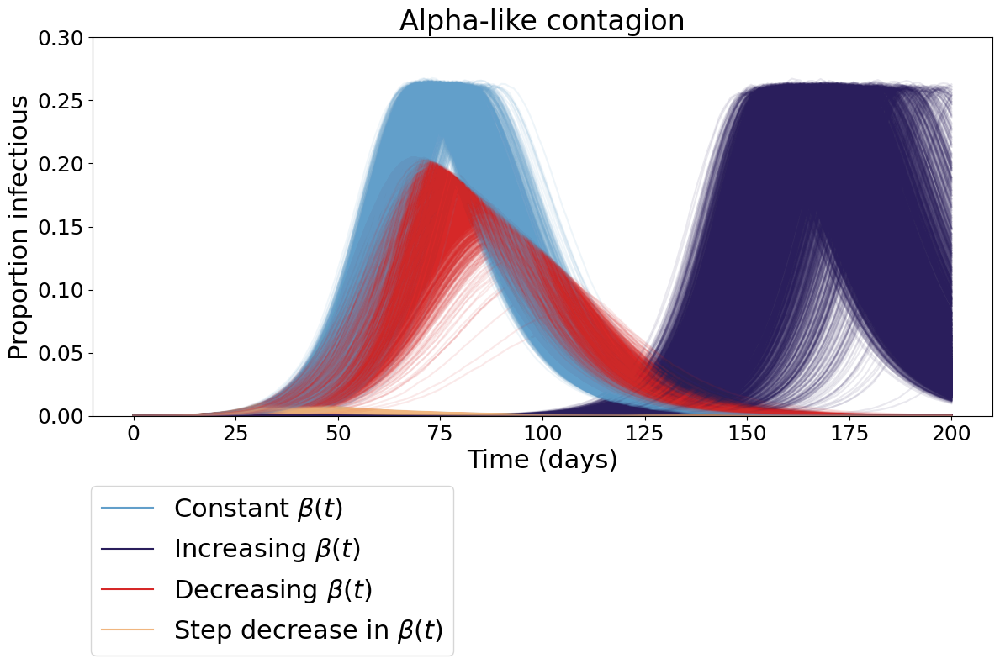

In [20]:
const_files = glob.glob('Cases/alpha/constant/I*.npy')
for i, file in enumerate(const_files):
    I_constant = np.load(file) if i == 0 else np.vstack((I_constant,np.load(file)))
increasing_files = glob.glob('Cases/alpha/increasing/I*.npy')
for i, file in enumerate(increasing_files):
    I_increasing = np.load(file) if i == 0 else np.vstack((I_increasing,np.load(file)))
decreasing_files = glob.glob('Cases/alpha/decreasing/I*.npy')
for i, file in enumerate(decreasing_files):
    I_decreasing = np.load(file) if i == 0 else np.vstack((I_decreasing,np.load(file)))
step_files = glob.glob('Cases/alpha/step/I*.npy')
for i, file in enumerate(step_files):
    I_step = np.load(file) if i == 0 else np.vstack((I_step,np.load(file)))
I_constant = I_constant[:10000,:]
I_decreasing = I_decreasing[:10000,:]
I_increasing = I_increasing[:10000,:]
I_step = I_step[:10000,:]
days = np.arange(0,max_time+0.1,1)
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(days, I_constant[0], '#629FCA',label=r'Constant $\beta(t)$')
ax.plot(days, I_increasing[0], '#2A1E5C',label=r'Increasing $\beta(t)$')
ax.plot(days, I_decreasing[0], '#D62828',label=r'Decreasing $\beta(t)$')
ax.plot(days, I_step[0], '#F0B67F',label=r'Step decrease in $\beta(t)$')
for i in range(1,10000):
    ax.plot(days, I_constant[i], '#629FCA',alpha=0.1,)
    ax.plot(days, I_increasing[i], '#2A1E5C',alpha=0.1)
    ax.plot(days, I_decreasing[i], '#D62828',alpha=0.1)
    ax.plot(days, I_step[i], '#F0B67F',alpha=0.1)
ax.legend(fontsize=22,loc='upper center', bbox_to_anchor=(0.2, -0.15))
ax.set_ylim([0,0.3])
ax.set_ylabel('Proportion infectious',fontsize=22)
ax.set_xlabel('Time (days)',fontsize=22)
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)
plt.tight_layout()
plt.title('Alpha-like contagion',fontsize=24)
plt.savefig("Figures/alpha_res_prev.png",dpi=300,bbox_inches='tight')

## Wild-type-like

In [8]:
# Constant Parameters
N = 1e5  # Total population
delta = 1/5 # Symptom onset rate (1/delta is the infectious)
gamma = 1/10  # Recovery rate (1/gamma is the infectious period)
R_0 = 3.1 # Basic reproduction number estimated for alpha variant
mu = 0.00003424657  # Birth and death rate
initial_infected = 10
initial_exposed = 0
max_time = 200
beta0 = R_0 * (delta+mu)*(gamma+mu)/delta
num_res = 100
print(beta0)

beta_trans = 1 * (delta+mu)*(gamma+mu)/delta
print(beta_trans)

0.31015926472932714
0.10005137571913779


In [9]:
def test_int(X, t, betat, gamma, delta, mu):
    '''
    ODE's for Model 2: SIS with increasing vaccination rate model (elimination by vaccination)
    returns: prevalence mean-field equations (dI/dt), variance of fluctuations (Ivar, d\zeta/dt) and kurtosis of fluctuations (Ikurt)
    RUN: defines if p(t) (rate of vaccine uptake) will be slowing increasing for Ext simulations or fixed for null simulations 
    '''
    S = -betat(t)*X[0]*X[2]-mu*X[0]+mu
    E = betat(t)*X[0]*X[2]-(mu+delta)*X[1]
    I = delta*X[1] - (mu+gamma)*X[2]

    A = np.matrix([[-betat(t)*X[2]-mu, 0, -betat(t)*X[0]], 
                   [betat(t)*X[2],-(delta+mu),betat(t)*X[0]],
                   [0,delta,-(gamma+mu)]])
    B = np.matrix([[betat(t)*X[0]*X[2]+mu*X[0]+mu,-betat(t)*X[0]*X[2],0],
                   [-betat(t)*X[0]*X[2],betat(t)*X[0]*X[2]+(delta+mu)*X[1],-delta*X[1]],
                   [0,-delta*X[1],delta*X[1]+(gamma+mu)*X[2]]])

    Θ = np.matrix([[X[3],X[4],X[5]],
                   [X[4],X[6],X[7]],
                   [X[5],X[7],X[8]]])

    K = A*Θ +Θ*A.transpose()+B/1e5
    return [S, E, I, K[0,0], K[0,1], K[0,2], K[1,1], K[1,2], K[2,2]]

betat = lambda x: 0.310159
p = (0.310159-0.05)/100
tau = 30
def beta_increasing_t(t):
    betat = 0.05+p*(t-tau) if t > tau else 0.05
    if betat >= 0.310159:
        return 0.310159
    else:
        return betat

def beta_decreasing_t(t):
    betat = 0.310159-p*(t-tau) if t > tau else 0.310159
    if betat <= 0.05:
        return 0.05
    else:
        return betat

def beta_step_t(t):
    return 0.310159 if t<tau else 0.05

from scipy.integrate import odeint
ts = np.arange(0,200.1,0.1)
cst_theory = odeint(test_int,[(1e5-10)/1e5,0,10/1e5,0,0,0,0,0,0],ts,args=(betat,1/10,1/5,0.00003424657))
cst_inc = odeint(test_int,[(1e5-10)/1e5,0,10/1e5,0,0,0,0,0,0],ts,args=(beta_increasing_t,1/10,1/5,0.00003424657))
cst_dec = odeint(test_int,[(1e5-10)/1e5,0,10/1e5,0,0,0,0,0,0],ts,args=(beta_decreasing_t,1/10,1/5,0.00003424657))
cst_step = odeint(test_int,[(1e5-10)/1e5,0,10/1e5,0,0,0,0,0,0],ts,args=(beta_step_t,1/10,1/5,0.00003424657))

In [10]:
def long_run_averages(standardised):
    n = len(standardised)
    running_mean = np.zeros(n)
    running_std= np.zeros(n)
    for j in range(n):
        running_mean[j] = np.nanmean(standardised[1:j+1])
        running_std[j] = np.nanstd(standardised[1:j+1])
    return running_std, running_mean

def exceed_threshold_cutoffs(stat_timeseries, ltla):
    std_val = []
    mean_val = []
    running_std, running_mean = long_run_averages(stat_timeseries[ltla].values)
    std_val = np.concatenate((std_val,running_std))
    mean_val = np.concatenate((mean_val,running_mean))
    # Get indices where stat > mean + 2*sigma and indices where stat < mean - 2*sigma
    stat_timeseries = stat_timeseries[ltla].values
    indices_greater = [ n for n,i in enumerate(range(len(stat_timeseries))) if (stat_timeseries[i])>(mean_val+2*std_val)[i] ]
    indices_smaller =  [ n for n,i in enumerate(range(len(stat_timeseries))) if (stat_timeseries[i])<(mean_val-2*std_val)[i] ]
    all_indices = np.setdiff1d(np.unique(indices_greater + indices_smaller ),[1])    
    return all_indices,mean_val,std_val
    
def loop_EWSs_store_results_cutoffs(ews_dict, ltlas):
    indices_dict = {}
    mean_dict = {}
    std_dict = {}
    for stat in ews_dict.keys():
        indices_dict[stat] = {}
        mean_dict[stat] = {}
        std_dict[stat] = {}
        for ltla in ltlas:
            stat_data = ews_dict[stat][ltla].reset_index()
            indices, mean_val, std_val = exceed_threshold_cutoffs(stat_data, ltla)
            indices_dict[stat][ltla] = indices
            mean_dict[stat][ltla] = mean_val
            std_dict[stat][ltla] = std_val
    return indices_dict, mean_dict, std_dict

# Function to normalise EWS for 2-sigma calculations
def pandas_zscore(dataframe):
    rolling_mean = dataframe.expanding().mean()
    rolling_std = dataframe.expanding().std(ddof=0)
    normalise_stats = (dataframe - rolling_mean)/rolling_std
    return normalise_stats

# Function to calculate EWS on a rolling window for each column
def calculate_ews_rolling(wide_data, window_size):
    ews_data = {}
    rolling = wide_data.rolling(window=window_size,center=False, min_periods=1)
    # variance = (wide_data**2).rolling(window=window_size,center=False, min_periods=1).mean()
    variance = rolling.var()
    ews_data['variance'] = variance
    normalised_ews_data = {}
    for ews in ews_data.keys():
        normalised_ews_data[ews] = pandas_zscore(ews_data[ews])
    return ews_data, normalised_ews_data

# Get detect indices for timeline
from operator import itemgetter

def detect(arr, times, n):
    if len(arr) < n:
        return []
    time = []
    values = []
    i = 0
    while i < len(arr) - (n - 1):
        if all(arr[i + j] + 1 == arr[i + j + 1] for j in range(n - 1)):
            values.append(arr[i + n - 1])
            time.append(times[arr[i + n -1]])
            # Skip to the end of this sequence of consecutive numbers
            while i + n - 1 < len(arr) - 1 and arr[i + n - 1] + 1 == arr[i + n]:
                i += 1
        i += 1
    return time

In [11]:
const_files = glob.glob('Cases/wild/constant/I*.npy')
for i, file in enumerate(const_files):
    I_constant = np.load(file) if i == 0 else np.vstack((I_constant,np.load(file)))
    R_file = file.replace('I','R')
    Reff_constant = np.load(R_file) if i == 0 else np.vstack((Reff_constant,np.load(R_file)))
increasing_files = glob.glob('Cases/wild/increasing/I*.npy')
for i, file in enumerate(increasing_files):
    I_increasing = np.load(file) if i == 0 else np.vstack((I_increasing,np.load(file)))
    R_file = file.replace('I','R')
    Reff_increasing = np.load(R_file) if i == 0 else np.vstack((Reff_increasing,np.load(R_file)))
decreasing_files = glob.glob('Cases/wild/decreasing/I*.npy')
for i, file in enumerate(decreasing_files):
    I_decreasing = np.load(file) if i == 0 else np.vstack((I_decreasing,np.load(file)))
    R_file = file.replace('I','R')
    Reff_decreasing = np.load(R_file) if i == 0 else np.vstack((Reff_decreasing,np.load(R_file)))
step_files = glob.glob('Cases/wild/step/I*.npy')
for i, file in enumerate(step_files):
    I_step = np.load(file) if i == 0 else np.vstack((I_step,np.load(file)))
    R_file = file.replace('I','R')
    Reff_step = np.load(R_file) if i == 0 else np.vstack((Reff_step,np.load(R_file)))
days = np.arange(0,max_time+0.1,1)
max_time = 200
days = np.arange(0,max_time+0.1,1)
times = np.arange(0,max_time+0.1,0.1)
tau = 30
num_res = 10000

drop_list = []
for i in range(np.shape(I_increasing)[0]):
    if Reff_increasing[i,1900] >= 3.75:
        drop_list.append(i)
I_increasing = np.delete(I_increasing, drop_list,axis=0)
Reff_increasing = np.delete(Reff_increasing, drop_list,axis=0)

num_res_inc = len(I_increasing)
num_res_inc
I_constant = I_constant[:10000,:]
I_decreasing = I_decreasing[:10000,:]
I_increasing = I_increasing[:num_res_inc,:]
I_step = I_step[:10000,:]
Reff_constant = Reff_constant[:10000,:]
Reff_decreasing = Reff_decreasing[:10000,:]
Reff_increasing = Reff_increasing[:num_res_inc,:]
Reff_step = Reff_step[:10000,:]
df = pd.DataFrame(I_constant).T
stoch_cst = df.sub(df.mean(axis = 1), axis = 'rows')
df_step = pd.DataFrame(I_step).T
stoch_step = df_step.sub(df_step.mean(axis = 1), axis = 'rows')
df_increasing = pd.DataFrame(I_increasing).T
stoch_inc = df_increasing.sub(df_increasing.mean(axis = 1), axis = 'rows')
df_decreasing = pd.DataFrame(I_decreasing).T
stoch_dec = df_decreasing.sub(df_decreasing.mean(axis = 1), axis = 'rows')
df_increasing = pd.DataFrame(I_increasing).T
stoch_inc = df_increasing.sub(df_increasing.mean(axis = 1), axis = 'rows')

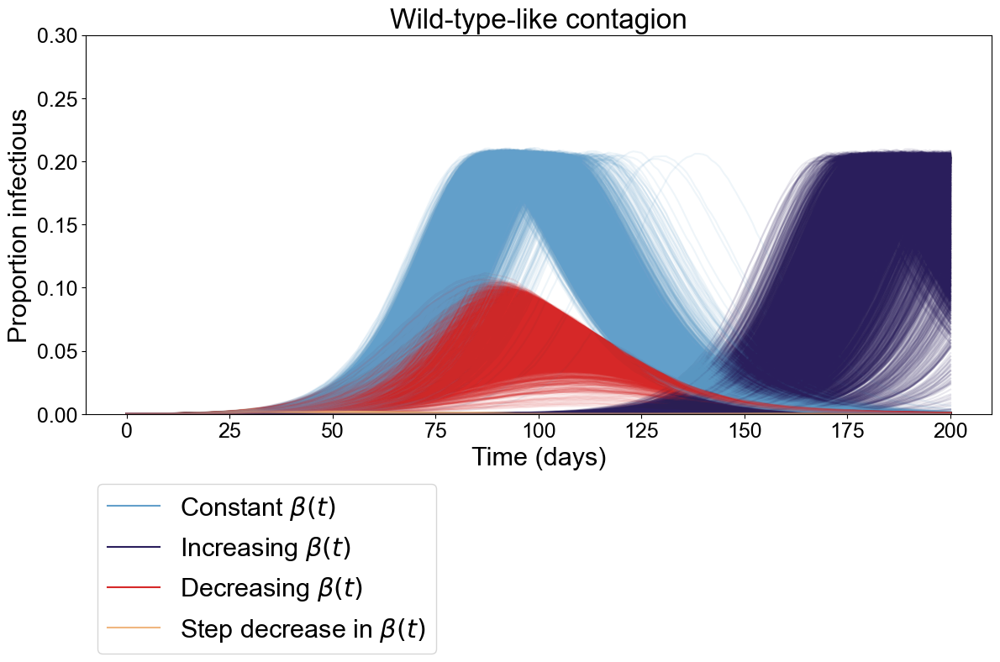

In [12]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(days, I_constant[0], '#629FCA',label=r'Constant $\beta(t)$')
ax.plot(days, I_increasing[0], '#2A1E5C',label=r'Increasing $\beta(t)$')
ax.plot(days, I_decreasing[0], '#D62828',label=r'Decreasing $\beta(t)$')
ax.plot(days, I_step[0], '#F0B67F',label=r'Step decrease in $\beta(t)$')
for i in range(1,10000):
    ax.plot(days, I_constant[i], '#629FCA',alpha=0.1,)
    ax.plot(days, I_increasing[i], '#2A1E5C',alpha=0.1)
    ax.plot(days, I_decreasing[i], '#D62828',alpha=0.1)
    ax.plot(days, I_step[i], '#F0B67F',alpha=0.1)
ax.legend(fontsize=22,loc='upper center', bbox_to_anchor=(0.2, -0.15))
ax.set_ylim([0,0.3])
ax.set_ylabel('Proportion infectious',fontsize=22)
ax.set_xlabel('Time (days)',fontsize=22)
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)
plt.tight_layout()
plt.title('Wild-type-like contagion',fontsize=24)
plt.savefig("Figures/wild_res_prev.png",dpi=300,bbox_inches='tight')

In [13]:
const_files = glob.glob('Cases/wild/constant/I*.npy')
for i, file in enumerate(const_files):
    I_constant = np.load(file) if i == 0 else np.vstack((I_constant,np.load(file)))
    R_file = file.replace('I','R')
    Reff_constant = np.load(R_file) if i == 0 else np.vstack((Reff_constant,np.load(R_file)))
increasing_files = glob.glob('Cases/wild/increasing/I*.npy')
for i, file in enumerate(increasing_files):
    I_increasing = np.load(file) if i == 0 else np.vstack((I_increasing,np.load(file)))
    R_file = file.replace('I','R')
    Reff_increasing = np.load(R_file) if i == 0 else np.vstack((Reff_increasing,np.load(R_file)))
decreasing_files = glob.glob('Cases/wild/decreasing/I*.npy')
for i, file in enumerate(decreasing_files):
    I_decreasing = np.load(file) if i == 0 else np.vstack((I_decreasing,np.load(file)))
    R_file = file.replace('I','R')
    Reff_decreasing = np.load(R_file) if i == 0 else np.vstack((Reff_decreasing,np.load(R_file)))
step_files = glob.glob('Cases/wild/step/I*.npy')
for i, file in enumerate(step_files):
    I_step = np.load(file) if i == 0 else np.vstack((I_step,np.load(file)))
    R_file = file.replace('I','R')
    Reff_step = np.load(R_file) if i == 0 else np.vstack((Reff_step,np.load(R_file)))
days = np.arange(0,max_time+0.1,1)

max_time = 200
days = np.arange(0,max_time+0.1,1)
times = np.arange(0,max_time+0.1,0.1)
tau = 30
num_res = 10000

drop_list = []
for i in range(np.shape(I_increasing)[0]):
    if Reff_increasing[i,1900] >= 2.9:
        drop_list.append(i)
I_increasing = np.delete(I_increasing, drop_list,axis=0)
Reff_increasing = np.delete(Reff_increasing, drop_list,axis=0)
num_res_inc = len(I_increasing)

I_constant = I_constant[:10000,:]
I_decreasing = I_decreasing[:10000,:]
I_increasing = I_increasing[:num_res_inc,:]
I_step = I_step[:10000,:]
days = np.arange(0,max_time+0.1,1)

In [14]:
df = pd.DataFrame(I_constant).T
stoch_cst = df.sub(df.mean(axis = 1), axis = 'rows')
df_step = pd.DataFrame(I_step).T
stoch_step = df_step.sub(df_step.mean(axis = 1), axis = 'rows')
df_increasing = pd.DataFrame(I_increasing).T
stoch_inc = df_increasing.sub(df_increasing.mean(axis = 1), axis = 'rows')
df_decreasing = pd.DataFrame(I_decreasing).T
stoch_dec = df_decreasing.sub(df_decreasing.mean(axis = 1), axis = 'rows')

In [15]:
import pickle
if True:
    cst, cst_norm = calculate_ews_rolling(stoch_cst, 7)
    inc, inc_norm = calculate_ews_rolling(stoch_inc, 7)
    dec, dec_norm = calculate_ews_rolling(stoch_dec, 7)
    step, step_norm = calculate_ews_rolling(stoch_step, 7)

    ind_cst, mean_cst, std_cst = loop_EWSs_store_results_cutoffs(cst_norm,np.arange(num_res))
    ind_inc, mean_inc, std_inc = loop_EWSs_store_results_cutoffs(inc_norm,np.arange(num_res_inc))
    ind_dec, mean_dec, std_dec = loop_EWSs_store_results_cutoffs(dec_norm,np.arange(num_res))
    ind_step, mean_step, std_step = loop_EWSs_store_results_cutoffs(step_norm,np.arange(num_res))
    times_cst = {}
    times_inc = {}
    times_dec = {}
    times_step = {}

    for sim in np.arange(num_res):
        times_cst[sim] = detect(ind_cst['variance'][sim],days,3)
        times_dec[sim] = detect(ind_dec['variance'][sim],days,3)
        times_step[sim] = detect(ind_step['variance'][sim],days,3)

    for sim in np.arange(num_res_inc):
        times_inc[sim] = detect(ind_inc['variance'][sim],days,3)
    with open('Results/cases_times_const_wild_corr.pkl','wb') as output:
        pickle.dump(times_cst, output)
    with open('Results/cases_times_inc_wild_corr.pkl','wb') as output:
        pickle.dump(times_inc, output)
    with open('Results/cases_times_dec_wild_corr.pkl','wb') as output:
        pickle.dump(times_dec, output)
    with open('Results/cases_times_step_wild_corr.pkl','wb') as output:
        pickle.dump(times_step, output)
else:
    cst, cst_norm = calculate_ews_rolling(stoch_cst, 7)
    inc, inc_norm = calculate_ews_rolling(stoch_inc, 7)
    dec, dec_norm = calculate_ews_rolling(stoch_dec, 7)
    step, step_norm = calculate_ews_rolling(stoch_step, 7)
    with open('Results/cases_times_const_wild_corr.pkl','rb') as output:
        times_cst = pickle.load(output)
    with open('Results/cases_times_inc_wild_corr.pkl','rb') as output:
        times_inc = pickle.load(output)
    with open('Results/cases_times_dec_wild_corr.pkl','rb') as output:
        times_dec = pickle.load(output)
    with open('Results/cases_times_step_wild_corr.pkl','rb') as output:
        times_step = pickle.load(output)

/tmp/ipykernel_561031/3963577503.py:6: RuntimeWarning: Mean of empty slice
  running_mean[j] = np.nanmean(standardised[1:j+1])
/home/jlooker/anaconda3/envs/mathsysbase/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/tmp/ipykernel_561031/3963577503.py:6: RuntimeWarning: Mean of empty slice
  running_mean[j] = np.nanmean(standardised[1:j+1])
/home/jlooker/anaconda3/envs/mathsysbase/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/tmp/ipykernel_561031/3963577503.py:6: RuntimeWarning: Mean of empty slice
  running_mean[j] = np.nanmean(standardised[1:j+1])
/home/jlooker/anaconda3/envs/mathsysbase/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=d

In [16]:
# Get detect indices for timeline
constant_crit = np.mean(times[np.where(np.abs(np.mean(Reff_constant,axis=0)-1)<=1e-2)])
inc_crit_up = np.mean(times[np.where(np.abs(np.mean(Reff_increasing,axis=0)-1)<=1e-2)][:8])
inc_crit_down = np.mean(times[np.where(np.abs(np.mean(Reff_increasing,axis=0)-1)<=1e-2)][8:])
dec_crit = np.mean(times[np.where(np.abs(np.mean(Reff_decreasing,axis=0)-1)<=1e-2)])
step_crit = tau

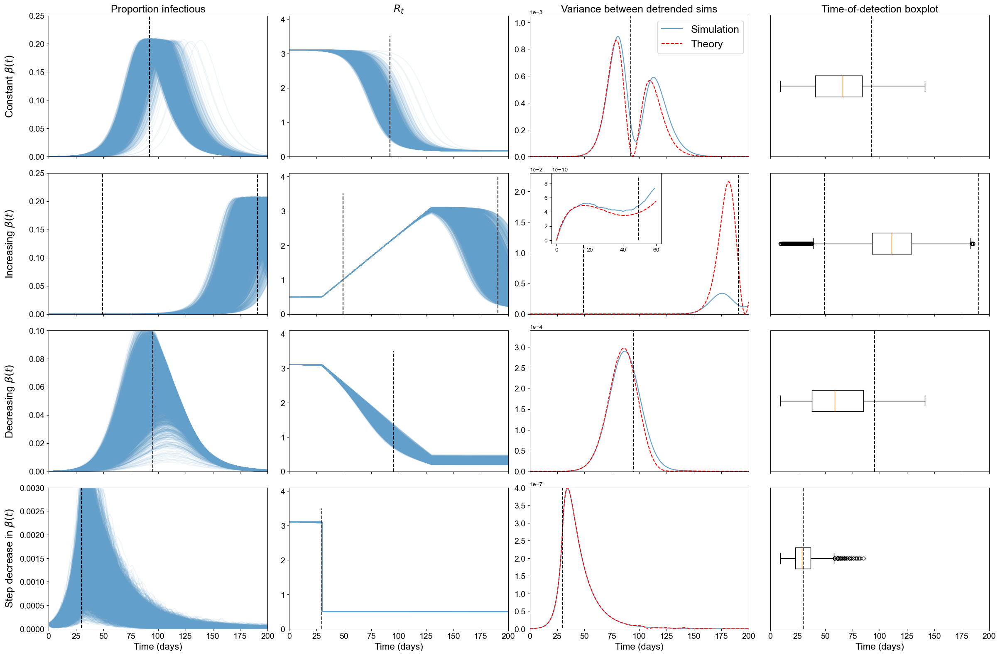

In [17]:
def norm(x):
    rolling_mean = x.expanding().mean()
    rolling_std = x.expanding().std(ddof=0)
    return (x-rolling_mean)/rolling_std

up_lims = [1.05e-3,2.3e-2,3.4e-4,4e-7]
up_lims_p = [0.25,0.25,0.1,0.003]

fig, axs = plt.subplots(nrows = 4, ncols = 4, figsize=(24,16),sharex=True)
for i in range(num_res):
    axs[0,0].plot(days,I_constant[i],color='#629FCA',alpha=0.1)
    axs[0,1].plot(times,Reff_constant[i],color='#629FCA',alpha=0.1)
axs[0,2].plot(days,stoch_cst.var(axis=1).values,color='#629FCA',label='Simulation')
axs[0,2].plot(ts,cst_theory[:,-1],color='r',linestyle='--',label='Theory')
axs[0,3].boxplot([j for i in times_cst.values() for j in i],vert=False)

axs[0,0].vlines(constant_crit,ymin=axs[0,0].get_yticks()[0],ymax=up_lims_p[0],color='k',linestyle='--')
axs[0,1].vlines(constant_crit,ymin=axs[0,1].get_yticks()[0],ymax=axs[0,1].get_yticks()[-1],color='k',linestyle='--')
axs[0,2].vlines(constant_crit,ymin=axs[0,2].get_yticks()[0],ymax=up_lims[0],color='k',linestyle='--')
axs[0,3].vlines(constant_crit,0.5,1.5,color='k',linestyle='--')

for i in range(num_res_inc):
    axs[1,0].plot(days,I_increasing[i],color='#629FCA',alpha=0.1)
    axs[1,1].plot(times,Reff_increasing[i],color='#629FCA',alpha=0.1)
axs[1,2].plot(days,stoch_inc.var(axis=1).values,color='#629FCA')
axs[1,2].plot(ts,cst_inc[:,-1],linestyle='--',color='r')
axs[1,3].boxplot([j for i in times_inc.values() for j in i],vert=False)


axs[1,0].vlines(inc_crit_up,ymin=axs[1,0].get_yticks()[0],ymax=up_lims_p[1],color='k',linestyle='--')
axs[1,1].vlines(inc_crit_up,ymin=axs[1,1].get_yticks()[0],ymax=axs[1,1].get_yticks()[-1],color='k',linestyle='--')
axs[1,2].vlines(inc_crit_up,ymin=axs[1,2].get_yticks()[0],ymax=up_lims[1],color='k',linestyle='--')
axs[1,3].vlines(inc_crit_up,0.5,1.5,color='k',linestyle='--')
axs[1,0].vlines(inc_crit_down,ymin=axs[1,0].get_yticks()[0],ymax=up_lims_p[1],color='k',linestyle='--')
axs[1,1].vlines(inc_crit_down,ymin=axs[1,1].get_yticks()[0],ymax=axs[1,1].get_yticks()[-1],color='k',linestyle='--')
axs[1,2].vlines(inc_crit_down,ymin=axs[1,2].get_yticks()[0],ymax=up_lims[1],color='k',linestyle='--')
axs[1,3].vlines(inc_crit_down,0.5,1.5,color='k',linestyle='--')

for i in range(num_res):
    axs[2,0].plot(days,I_decreasing[i],color='#629FCA',alpha=0.1)
    axs[2,1].plot(times,Reff_decreasing[i],color='#629FCA',alpha=0.1)
axs[2,2].plot(days,stoch_dec.var(axis=1).values,color='#629FCA')
axs[2,2].plot(ts,cst_dec[:,-1],linestyle='--',color='r')
axs[2,3].boxplot([j for i in times_dec.values() for j in i],vert=False)

axs[2,0].vlines(dec_crit,ymin=axs[2,0].get_yticks()[0],ymax=up_lims_p[2],color='k',linestyle='--')
axs[2,1].vlines(dec_crit,ymin=axs[2,1].get_yticks()[0],ymax=axs[2,1].get_yticks()[-1],color='k',linestyle='--')
axs[2,2].vlines(dec_crit,ymin=axs[2,2].get_yticks()[0],ymax=up_lims[2],color='k',linestyle='--')
axs[2,3].vlines(dec_crit,0.5,1.5,color='k',linestyle='--')

for i in range(num_res):
    axs[3,0].plot(days,I_step[i],color='#629FCA',alpha=0.1)
    axs[3,1].plot(times,Reff_step[i],color='#629FCA',alpha=0.1)
axs[3,0].set_xlabel('Time (days)',fontsize=16)
axs[3,1].set_xlabel('Time (days)',fontsize=16)
axs[3,2].plot(days,stoch_step.var(axis=1).values,color='#629FCA')
axs[3,2].plot(ts,cst_step[:,-1],linestyle='--',color='red')
axs[3,2].set_xlabel('Time (days)',fontsize=16)  
axs[3,3].boxplot([j for i in times_step.values() for j in i],vert=False)
axs[3,3].set_xlabel('Time (days)',fontsize=16)

axs[3,0].vlines(step_crit,ymin=axs[3,0].get_yticks()[0],ymax=up_lims_p[3],color='k',linestyle='--')
axs[3,1].vlines(step_crit,ymin=axs[3,1].get_yticks()[0],ymax=axs[3,1].get_yticks()[-1],color='k',linestyle='--')
axs[3,2].vlines(step_crit,ymin=axs[3,2].get_yticks()[0],ymax=up_lims[3],color='k',linestyle='--')
axs[3,3].vlines(step_crit,0.5,1.5,color='k',linestyle='--')

axs[0,0].set_title('Proportion infectious',fontsize=18)
axs[0,1].set_title(r'$R_t$',fontsize=18)
axs[0,2].set_title('Variance between detrended sims',fontsize=18)
axs[0,3].set_title('Time-of-detection boxplot',fontsize=18)

labels= [r'Constant $\beta(t)$',r'Increasing $\beta(t)$', r'Decreasing $\beta(t)$', r'Step decrease in $\beta(t)$']
for i in range(4):
    for j in range(4):
        axs[i,j].tick_params(axis='x', labelsize=14)
        axs[i,j].tick_params(axis='y', labelsize=14)
        if j == 3:
            axs[i,j].set_yticks([])
        if j == 0:
            axs[i,j].set_ylim((0,axs[i,j].get_ylim()[-1]))
        axs[i,j].set_xlim((0,200))
for i in range(4):
    axs[i,0].set_ylim([0,up_lims_p[i]])
    axs[i,1].set_ylim([0,4.1])
    axs[i,2].set_ylim([0,up_lims[i]])
    axs[i,2].ticklabel_format(axis='y',style='sci',scilimits=(0,0))
    axs[i,0].set_ylabel(labels[i],fontsize=18)
    axs[i,0].get_yaxis().set_label_coords(-0.15,0.5)
axs[0,2].legend(fontsize=18,loc = 'upper right')

iax = axs[1,2].inset_axes([0.1, 0.5, 0.5, 0.5])  # [left, bottom, width, height]
iax.plot(days[:60],stoch_inc.var(axis=1).values[:60],color='#629FCA')
iax.plot(ts[:600],cst_inc[:600,-1],linestyle='--',color='r')
iax.vlines(inc_crit_up,ymin=0,ymax=9e-10,color='k',linestyle='--')

plt.tight_layout()
plt.savefig("Figures/prevalence_wildtype_theory_corr_inset.png",dpi=300,bbox_inches='tight')
plt.show()